<a href="https://colab.research.google.com/github/memowayun/SDC_proyecto_final/blob/main/Proyecto_Final_Equipo17.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Proyecto Final**

**Equipo 17**

- Generación de data con simulador
- Entrenamiento de red neuronal convusional para navegación autónoma
- Prueba de rendimiento de modelo en simulador audicity



# Se cargan las bibliotecas necesarias

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import keras

import cv2
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam
from keras.utils.np_utils import to_categorical
import random

from keras.layers import Dropout
from keras.layers import Flatten
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D

from keras.models import Model
import os
np.random.seed(0)

import plotly.graph_objects as go

#from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
import random
import ntpath
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg

from imgaug import augmenters as iaa

# Clonar repositorio donde se encuentran los datos generados (imagenes) del simulador
### https://github.com/memowayun/SDC_proyecto_final

## Almacenar la ruta de las imágenes

**Son datasets de imágenes de la simulación de conducción del vehículo en el simulador audicity**

Se generan imagenes de la conducción desde 3 camaras diferentes (izquierda, derecha y central) de un automovil que da 3 vueltas a la pista en un sentido y 3 vueltas a la pista en otro sentido

In [2]:
!git clone https://github.com/memowayun/SDC_proyecto_final

Cloning into 'SDC_proyecto_final'...
remote: Enumerating objects: 23897, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 23897 (delta 0), reused 4 (delta 0), pack-reused 23892
Receiving objects: 100% (23897/23897), 303.83 MiB | 19.60 MiB/s, done.
Resolving deltas: 100% (1/1), done.
Updating files: 100% (23888/23888), done.


Lectura del log de files cargados (de las imagenes cargadas)

In [3]:
datadir = '/content/SDC_proyecto_final'
columns = ['center', 'left', 'right', 'steering', 'throttle','reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data.head()

<ipython-input-3-4edc8f408da9>:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,center,left,right,steering,throttle,reverse,speed
0,/Users/memowayun/Documents/MNA/Cursos/navegacion_autonoma/proyecto_final/SDC_proyecto_final/IMG/center_2023_06_21_07_36_56_562.jpg,/Users/memowayun/Documents/MNA/Cursos/navegacion_autonoma/proyecto_final/SDC_proyecto_final/IMG/left_2023_06_21_07_36_56_562.jpg,/Users/memowayun/Documents/MNA/Cursos/navegacion_autonoma/proyecto_final/SDC_proyecto_final/IMG/right_2023_06_21_07_36_56_562.jpg,0.00,0.0,0.0,1.630071e-05
1,/Users/memowayun/Documents/MNA/Cursos/navegacion_autonoma/proyecto_final/SDC_proyecto_final/IMG/center_2023_06_21_07_36_56_633.jpg,/Users/memowayun/Documents/MNA/Cursos/navegacion_autonoma/proyecto_final/SDC_proyecto_final/IMG/left_2023_06_21_07_36_56_633.jpg,/Users/memowayun/Documents/MNA/Cursos/navegacion_autonoma/proyecto_final/SDC_proyecto_final/IMG/right_2023_06_21_07_36_56_633.jpg,0.00,0.0,0.0,1.553763e-05
2,/Users/memowayun/Documents/MNA/Cursos/navegacion_autonoma/proyecto_final/SDC_proyecto_final/IMG/center_2023_06_21_07_36_56_704.jpg,/Users/memowayun/Documents/MNA/Cursos/navegacion_autonoma/proyecto_final/SDC_proyecto_final/IMG/left_2023_06_21_07_36_56_704.jpg,/Users/memowayun/Documents/MNA/Cursos/navegacion_autonoma/proyecto_final/SDC_proyecto_final/IMG/right_2023_06_21_07_36_56_704.jpg,0.00,0.0,0.0,1.869367e-05
3,/Users/memowayun/Documents/MNA/Cursos/navegacion_autonoma/proyecto_final/SDC_proyecto_final/IMG/center_2023_06_21_07_36_56_778.jpg,/Users/memowayun/Documents/MNA/Cursos/navegacion_autonoma/proyecto_final/SDC_proyecto_final/IMG/left_2023_06_21_07_36_56_778.jpg,/Users/memowayun/Documents/MNA/Cursos/navegacion_autonoma/proyecto_final/SDC_proyecto_final/IMG/right_2023_06_21_07_36_56_778.jpg,-0.05,0.0,0.0,5.796753e-06
4,/Users/memowayun/Documents/MNA/Cursos/navegacion_autonoma/proyecto_final/SDC_proyecto_final/IMG/center_2023_06_21_07_36_56_847.jpg,/Users/memowayun/Documents/MNA/Cursos/navegacion_autonoma/proyecto_final/SDC_proyecto_final/IMG/left_2023_06_21_07_36_56_847.jpg,/Users/memowayun/Documents/MNA/Cursos/navegacion_autonoma/proyecto_final/SDC_proyecto_final/IMG/right_2023_06_21_07_36_56_847.jpg,-0.25,0.0,0.0,3.180846e-07


In [4]:
def path_leaf(path):
        # : Función para reconocer el path de imagen de cada cámara, removerlo y quedarnos sólo con el nombre de la imagen por cámara
        #   lo utilizaremos para segmentar las imagenes por cámara.
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()


,center,left,right,steering,throttle,reverse,speed
0,center_2023_06_21_07_36_56_562.jpg,left_2023_06_21_07_36_56_562.jpg,right_2023_06_21_07_36_56_562.jpg,0.00,0.0,0.0,1.630071e-05
1,center_2023_06_21_07_36_56_633.jpg,left_2023_06_21_07_36_56_633.jpg,right_2023_06_21_07_36_56_633.jpg,0.00,0.0,0.0,1.553763e-05
2,center_2023_06_21_07_36_56_704.jpg,left_2023_06_21_07_36_56_704.jpg,right_2023_06_21_07_36_56_704.jpg,0.00,0.0,0.0,1.869367e-05
3,center_2023_06_21_07_36_56_778.jpg,left_2023_06_21_07_36_56_778.jpg,right_2023_06_21_07_36_56_778.jpg,-0.05,0.0,0.0,5.796753e-06
4,center_2023_06_21_07_36_56_847.jpg,left_2023_06_21_07_36_56_847.jpg,right_2023_06_21_07_36_56_847.jpg,-0.25,0.0,0.0,3.180846e-07


# Exploración de los datos (distribución de la variable dependiente) de los datos recolectados en cada imagen

**En este problema, queremos hacer un problema de regresión que de acuerdo a las imágenes, el modelo prediga qué tipo de vuelta (ángulo) o "steering" tiene que dar el automóvil para mantenerse en la ruta**

**Observamos su distribución**

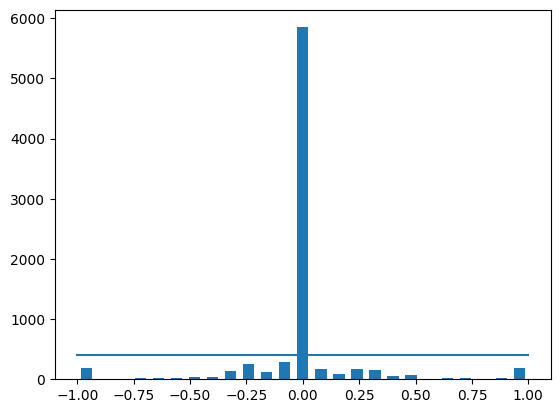

In [5]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])),
(samples_per_bin, samples_per_bin))


Existen más datos acumulados en el punto "0" dado que es el punto dónde le indicas al automóvil que no dé ninguna vuelta

Si limitamos el tamaño de cada bin a 400 observaciones, para hacer un zoom claro sobre la distribución, obtenemos lo siguiente

total imagenes: 7962
removed: 5449
remaining: 2513


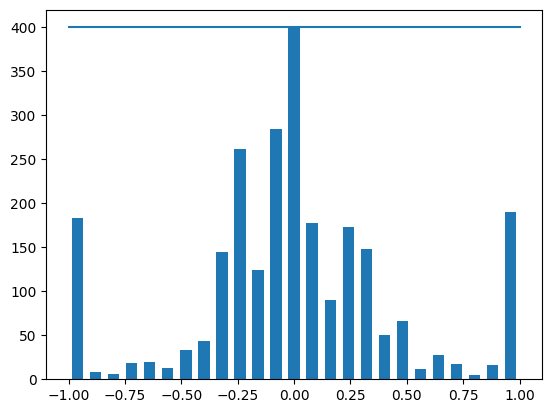

In [6]:
print('total imagenes:', len(data))
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])),
(samples_per_bin, samples_per_bin))


# Lectura de la ruta dónde se almacenan las imagenes por tipo de cámara

¿Cómo se ven los datos?

In [7]:
print(data.iloc[1])

center      center_2023_06_21_07_36_56_847.jpg
left        left_2023_06_21_07_36_56_847.jpg  
right       right_2023_06_21_07_36_56_847.jpg 
steering   -0.25                              
throttle    0.0                               
reverse     0.0                               
speed       0.0                               
Name: 4, dtype: object


Función para guardar las rutas de las imagenes en un objeto

In [8]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    ### Por requerimientos de la actividad sólo almacenamos la ruta y el steering de las imagenes en la cámara central
      indexed_data = data.iloc[i]
      center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
      image_path.append(os.path.join(datadir, center.strip()))
      steering.append(float(indexed_data[3]))
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

In [9]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)

Las rutas almacenadas se ven de la siguiente manera

In [10]:
len(image_paths)

2513

In [11]:
image_paths[0:10]

array(['/content/SDC_proyecto_final/IMG/center_2023_06_21_07_36_56_778.jpg',
       '/content/SDC_proyecto_final/IMG/center_2023_06_21_07_36_56_847.jpg',
       '/content/SDC_proyecto_final/IMG/center_2023_06_21_07_36_56_921.jpg',
       '/content/SDC_proyecto_final/IMG/center_2023_06_21_07_36_56_990.jpg',
       '/content/SDC_proyecto_final/IMG/center_2023_06_21_07_36_57_063.jpg',
       '/content/SDC_proyecto_final/IMG/center_2023_06_21_07_36_57_131.jpg',
       '/content/SDC_proyecto_final/IMG/center_2023_06_21_07_36_57_200.jpg',
       '/content/SDC_proyecto_final/IMG/center_2023_06_21_07_36_57_693.jpg',
       '/content/SDC_proyecto_final/IMG/center_2023_06_21_07_36_57_765.jpg',
       '/content/SDC_proyecto_final/IMG/center_2023_06_21_07_36_57_832.jpg'],
      dtype='<U66')

# Dividir la data en set de entrenamiento y set de validación

In [12]:
# Utilizamos un set de validación del 20% de la muestra
X_train, X_valid, y_train, y_valid = train_test_split(image_paths,steerings, test_size=0.2, random_state=1234)
print('Training Samples: {}\nValid Samples:{}'.format(len(X_train), len(X_valid)))

Training Samples: 2010
Valid Samples:503


Validamos la distribución de la variable dependiente (steering) en cada uno de los set (entrenamiento y validación) generados

Text(0.5, 1.0, 'Validation set')

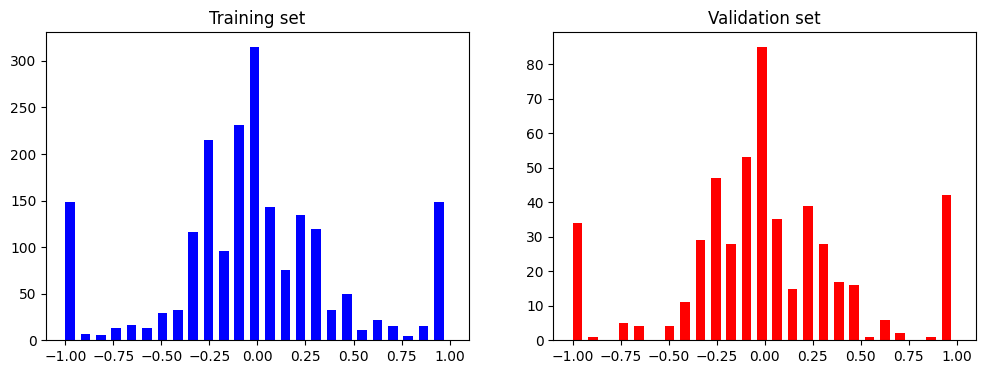

In [13]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Observamos que el muestreo aletorio es eficiente, ya que ambas muestras reflejan una distribución similar.

# Exploración y limpieza de imágenes

#### Zoom de la imágen sobre la región de interés

In [14]:
# Función para realizar el zoom a la imágen

def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image) # aumentamos el tamaño de la imagen
  return image


Ejemplo de aumentar el tamaño de la imagen

Text(0.5, 1.0, 'Zoomed Image')

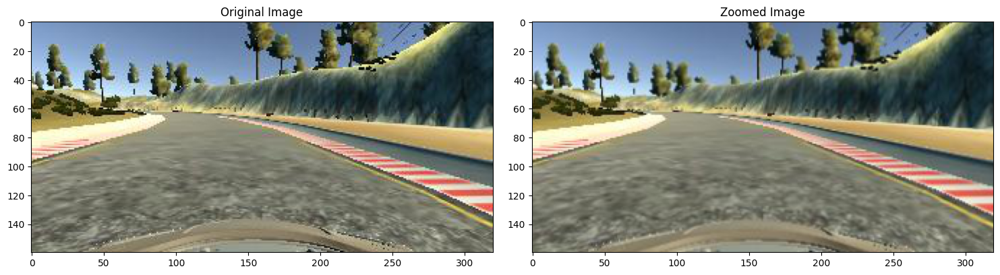

In [15]:
image = image_paths[random.randint(0, 1000)] # Seleccionamos una imagen aleatorioa
original_image = mpimg.imread(image)  # Cargamos la imagen original
zoomed_image = zoom(original_image)   # Creamos nueva imagen desde la original con la función de zoom

# Graficamos ambas imagenes
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

#### Pan the image (generar en la imagen una sensación de movimiento)

In [16]:
# Función para crear el panning sobre la imagen
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y":(-0.1, 0.1)})
  image = pan.augment_image(image)
  return image


Text(0.5, 1.0, 'Panned Image')

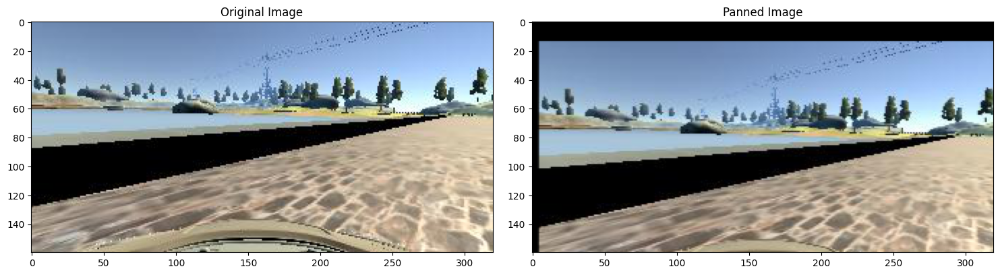

In [17]:
image = image_paths[random.randint(0, 1000)] # Seleccionamos imagen aleatoria
original_image = mpimg.imread(image)    # Lectura de imagen original
panned_image = pan(original_image)      # Transformación de imagen

# Grafica comparativa de imagenes
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

#### Modificamos el brillo de la imagen

In [18]:
# Función para realizar modificaciones al brillo de la imagen
def img_random_brightness(image):
  brightness = iaa.Multiply((0.2, 1.2))
  image = brightness.augment_image(image)
  return image

Text(0.5, 1.0, 'Brightness altered image ')

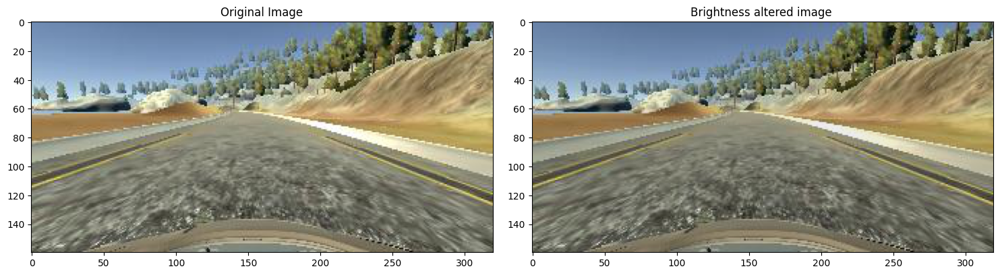

In [19]:
image = image_paths[random.randint(0, 1000)] # Seleccionamos imagen aleatoria
original_image = mpimg.imread(image)  # Imagen origianl
brightness_altered_image = img_random_brightness(original_image) # Transformación de imagen


# Gráfica de ambas imagenes
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

#### Giramos las imágenes para obtener un balance de las vueltas, ya que la pista utilizada en el simulador está sesgada a vueltas a la izquierda

In [20]:
# Función para girar la imagen
def img_random_flip(image, steering_angle):
  image = cv2.flip(image,1)
  steering_angle = -steering_angle
  return image, steering_angle

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.3')

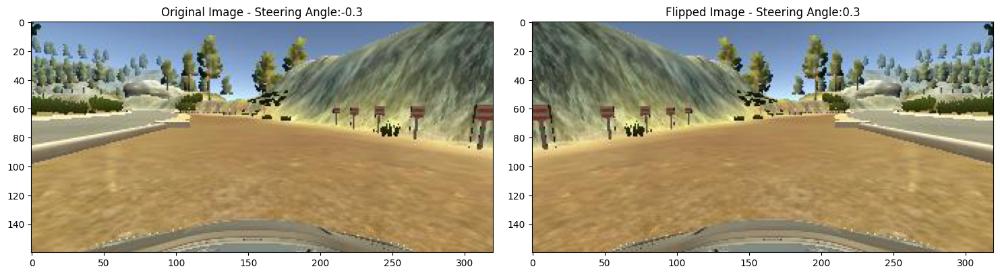

In [21]:
random_index = random.randint(0, 1000) # Imagen aleatoria
image = image_paths[random_index]       # Ruta de imagen seleccionada
steering_angle = steerings[random_index]  # Ángulo de la vuelta de la imagen seleccionada
original_image = mpimg.imread(image) # Imagen orignal
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle) # Imagen y ángulo con giro después de la transformación

# Comparativo de imagenes
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' +
str(steering_angle))
axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' +
str(flipped_steering_angle))

#### Ahora se muestra la transformación de imagenes de manera aleatoria, estas pueden sufrir cualquiera de las transformaciones anteriores: zoom, pan, brightness, flip

In [22]:
# Función para leer la imagen y realizar transformaciones aleatorioas
def random_augment(image, steering_angle):
  image = mpimg.imread(image)
  if np.random.rand() < 0.5:
    image = pan(image)
  if np.random.rand() < 0.5:
    image = zoom(image)
  if np.random.rand() < 0.5:
    image = img_random_brightness(image)
  if np.random.rand() < 0.5:
    image, steering_angle = img_random_flip(image,steering_angle)
  return image, steering_angle


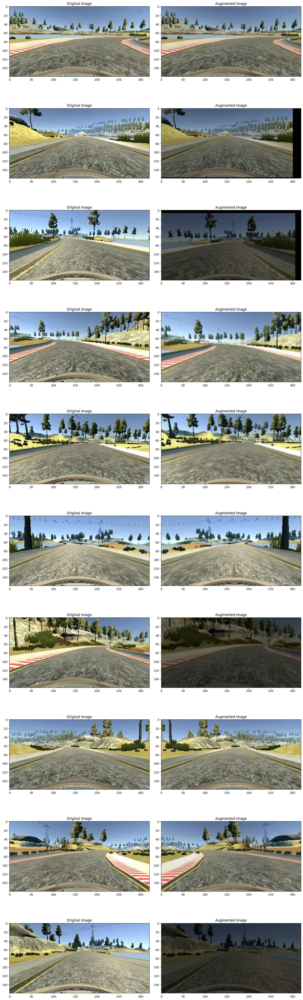

In [23]:
# Seleccionamos algunas imagenes para mostrar las transformaciones aleatorias
ncol = 2
nrow = 10
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()
for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]
  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image,random_steering)
  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")
  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

#### Pre procesamiento final -- Cortar la imagen y aplicar desenfoque Gaussiano

In [24]:
# Función para centrar el área de interés de cada imagen y desenfocar con un kernel gaussiano, adicionalmente se ajusta el tamaño de la imagen, y se estandariza
def img_preprocess(img):
  img = img[60:135,:,:]   # Recortamos la imagen
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV) # Aplicamos escala de color
  img = cv2.GaussianBlur(img, (3, 3), 0)  # Desenfoque Gaussiano
  img = cv2.resize(img, (200, 66)) # Ajuste de tamaño para que todas las imagenes sean iguales de tamaño
  img = img/255 # Esstandarización de tamaño
  return img


Text(0.5, 1.0, 'Preprocessed Image')

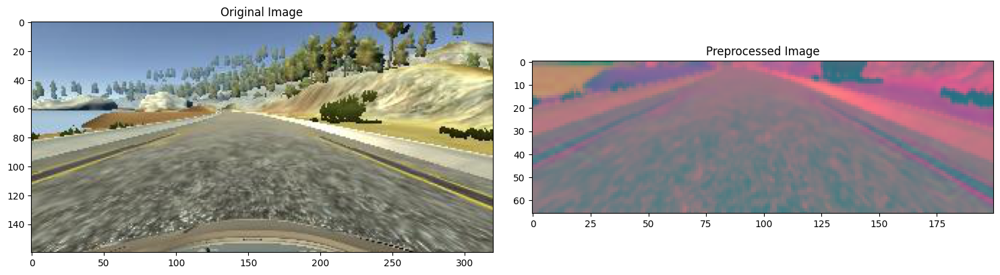

In [25]:
image = image_paths[100] # Tomamos una imagen aleatoria para mostrar la transformación anterior
original_image = mpimg.imread(image) # Imagen original
preprocessed_image = img_preprocess(original_image) # imagen transformada

# Comparativo sobre la imagen aleatoria después de la transformación
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

# Pre procesamiento en Batch de las imagenes :

A cada imagen

- Aplicamos de manera aleatoria las técnicas de Augmentation.


Y a todas las imagenes de manera estándar les aplicamos:

 - Recorte
 - Desenfoque Gaussiano
 - Ajuste de tamaño de imagen
 - Y estandarización de tamaño.

 Creamos un método para que se realice la transformación de cada imagen mientras entrena, y cuando se valide el modelo ya en el simulador

**Definimos el método a aplicar en batch a un set de imagenes**

In [26]:
def batch_generator(image_paths, steering_ang, batch_size,istraining):
  while True:
    batch_img = []
    batch_steering = []
    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1) # se realiza transformación sobre cada una de las imagenes sin repetirse
      if istraining: # a las de entrenamiento se aplica de manera aleatoria técnicas de augmentation
        im, steering = random_augment(image_paths[random_index],steering_ang[random_index])
      else:  # a las imagenes del set de validación se realiza la lectura
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]
      im = img_preprocess(im) # se aplica recorte, desenfoque gaussiano, y ajuste de tamaño para todas las imagenes
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

**Aplicamos el método anterior al set de entrenamiento y validación para mostrar su funcionamiento**

Text(0.5, 1.0, 'Validation Image')

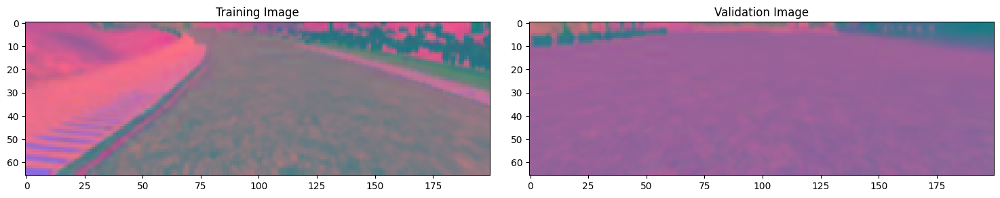

In [27]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1)) # Transformamos una imagen en el set de entrenamiento
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid,1, 0))  # Transformamos una imagen en el set de validación

# Tomamos aletoriamente las primeras imágenes de train y validation set para observar las transformaciones
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')
axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

# Desarrollo del modelo: Ariquitectura de Red Convusional NVIDIA para behavioral cloning

Es un problema de regresión, por lo cual se propone una red convusional de varias capas que utiliuza el MSE (mean square error) como función de costo.

Utilizamos la función de activación ELU (Exponential Linear Unit), ya que reduce más rápido la función de costo a cero (comparado con ReLU). Por otro lado, optimizamos con ADAM.

In [28]:
def nvidia_model():
  model = Sequential()
  #model.add(Conv2D(filters = 32, kernel_size = (3, 3), input_shape = x_train.shape[1:], activation='relu'))
  model.add(Conv2D(filters = 24, kernel_size = (5, 5), strides=(2,2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Conv2D(filters = 36, kernel_size = (5, 5), strides=(2,2), activation='elu'))
  model.add(Conv2D(filters = 48, kernel_size = (5, 5), strides=(2,2), activation='elu'))
  model.add(Conv2D(filters = 64, kernel_size = (3, 3), activation='elu'))
  model.add(Conv2D(filters = 64, kernel_size = (3, 3), activation='elu'))
  # model.add(tf.keras.layers.Dropout(0.5))
  model.add(Flatten())
  model.add(Dense(100, activation = 'elu'))
  model.add(Dense(50, activation = 'elu'))
  model.add(Dense(10, activation = 'elu'))
  model.add(Dense(1))
  #optimizer = Adam(lr=1e-3)
  #model.compile(loss='mse', optimizer=optimizer)
  model.compile(Adam(lr=1e-3), loss='mse')
  return model

In [29]:
model = nvidia_model()
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               1

/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


**Entrenamos y validamos**

In [30]:
history = model.fit_generator(batch_generator(X_train, y_train,100, 1),steps_per_epoch=300,epochs=10,validation_data=batch_generator(X_valid, y_valid, 100, 0),validation_steps=200,verbose=1,shuffle = 1)

<ipython-input-30-3a8df4aba68d>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train,100, 1),steps_per_epoch=300,epochs=10,validation_data=batch_generator(X_valid, y_valid, 100, 0),validation_steps=200,verbose=1,shuffle = 1)


Epoch 1/10
300/300 [==============================] - 199s 633ms/step - loss: 0.2655 - val_loss: 0.2010
Epoch 2/10
300/300 [==============================] - 148s 495ms/step - loss: 0.2056 - val_loss: 0.1849
Epoch 3/10
300/300 [==============================] - 143s 479ms/step - loss: 0.1948 - val_loss: 0.1740
Epoch 4/10
300/300 [==============================] - 141s 471ms/step - loss: 0.1748 - val_loss: 0.1213
Epoch 5/10
300/300 [==============================] - 141s 471ms/step - loss: 0.1581 - val_loss: 0.1075
Epoch 6/10
300/300 [==============================] - 139s 466ms/step - loss: 0.1385 - val_loss: 0.1207
Epoch 7/10
300/300 [==============================] - 145s 485ms/step - loss: 0.1342 - val_loss: 0.1066
Epoch 8/10
300/300 [==============================] - 143s 480ms/step - loss: 0.1221 - val_loss: 0.0900
Epoch 9/10
300/300 [==============================] - 185s 619ms/step - loss: 0.1159 - val_loss: 0.0972
Epoch 10/10
300/300 [==============================] - 146s 490m

Text(0.5, 0, 'Epoch')

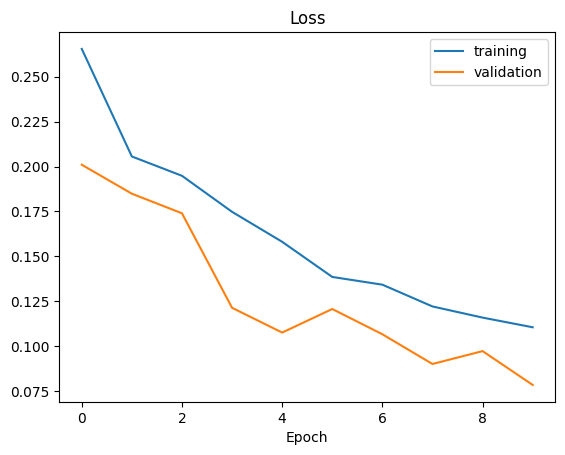

In [31]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

# Guardamos el modelo para utilizarlo en el simulador

In [32]:
model.save('model.nvidia.gg')